
<h1 style="text-align: center; background-color : #EF5A6F; color : white ; padding : 20px ; margin:20px ; border-radius : 15px ">Telecom churn Classification</h1>


![](https://camo.githubusercontent.com/03c0066300846b2396a87cd2c9ce4e296f8a51a32d9b620ab0aebbaaec7cbbb1/68747470733a2f2f6d656469612e6c6963646e2e636f6d2f646d732f696d6167652f44344431324151486568466a7246704c622d412f61727469636c652d636f7665725f696d6167652d736872696e6b5f3630305f323030302f302f313639323536353439353436333f653d3231343734383336343726763d6265746126743d463844374f4d75626956384b52707450614e2d7631556e6f474d6373534f456f70385268454b586972546b)


## <span style="color: #EF5A6F;">***Columns Description*** 📋</span>


> * <span >`State: The state of residence for the customer.`</span> 🏠

> * <span >`Account length: The duration (in months) that the customer has had an account.`</span> 📅

> * <span >`Area code: The area code of the customer's phone number.`</span> ☎️

> * <span >`International plan: Whether the customer has an international calling plan (yes/no).`</span> 🌍

> * <span >`Voice mail plan: Whether the customer has a voice mail plan (yes/no).`</span> 📬

> * <span >`Number vmail messages: The number of voice mail messages the customer has.`</span> 💌

> * <span >`Total day minutes: The total number of minutes the customer used during the day.`</span> 🌞

> * <span >`Total day calls: The total number of calls the customer made during the day.`</span> 📞

> * <span >`Total day charge: The total charges for the customer's day calls.`</span> 💲

> * <span >`Total eve minutes: The total number of minutes the customer used during the evening.`</span> 🌆

> * <span >`Total eve calls: The total number of calls the customer made during the evening.`</span> 📞

> * <span >`Total eve charge: The total charges for the customer's evening calls.`</span> 💲

> * <span >`Total night minutes: The total number of minutes the customer used during the night.`</span> 🌙

> * <span >`Total night calls: The total number of calls the customer made during the night.`</span> 📞

> * <span >`Total night charge: The total charges for the customer's night calls.`</span> 💲

> * <span >`Total intl minutes: The total number of international minutes used by the customer.`</span> 🌐

> * <span >`Total intl calls: The total number of international calls made by the customer.`</span> 📞

> * <span >`Total intl charge: The total charges for the customer's international calls.`</span> 💲

> * <span >`Customer service calls: The number of calls the customer made to customer service.`</span> 📞

> * <span >`Churn: Whether the customer churned (left the service) or not (yes/no).`</span> 🚪

# <div style="border-radius:10px;  padding: 12px; background-color: #EF5A6F; color : white ;  font-family:Comic Sans MS; font-family:Comic Sans MS; text-align:center"> LINKS </div>
​
#### **Name :** Mohamed Tawfik
​
<div style="text-align: left;">
    <table>
        <tr>
            <th><b>Links</b></th>
        </tr>
        <tr>
        </tr>
        <tr>
            <td>GitHub</td>
            <td><a href="https://github.com/MohammedTawfikEldeeb"><img src="https://img.shields.io/badge/GitHub-Profile-blue?style=for-the-badge&logo=github" alt="GitHub"/></a></td>
        </tr>
        <tr>
            <td>LinkedIn</td>
            <td><a href="https://www.linkedin.com/in/mohamed-tawfik-aaa4562a3/"><img src="https://img.shields.io/badge/LinkedIn-Profile-blue?style=for-the-badge&logo=linkedin" alt="LinkedIn"/></a></td>
        </tr>
        <tr>
        </tr>
        <tr>
    </table>

### `Importing Libraries`

In [511]:
## most important
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('fivethirtyeight')
# split the dataset
from sklearn.model_selection import train_test_split


# preprossing
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler , LabelEncoder , OrdinalEncoder
from sklearn.pipeline import Pipeline , FeatureUnion
from sklearn_features.transformers import DataFrameSelector
from datasist.structdata import detect_outliers
from sklearn.model_selection import cross_val_score, cross_val_predict
from imblearn.over_sampling import SMOTE


# Models
from sklearn.linear_model import LogisticRegression , SGDClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier 
from sklearn.ensemble import AdaBoostClassifier , BaggingClassifier , GradientBoostingClassifier , RandomForestClassifier , VotingClassifier
from sklearn.multiclass import OneVsOneClassifier
import xgboost as xgb
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, EarlyStopping

# Metrix 
from sklearn.metrics import accuracy_score , classification_report , precision_score , recall_score , confusion_matrix

# Tuning
from sklearn.model_selection import GridSearchCV , RandomizedSearchCV

### `Read Data`

In [512]:
df = pd.read_csv('telecom.csv')
df.head()

,state,account_length,area_code,phone_number,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day _charge,...,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,customer_service_calls,churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.90,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


# `EDA`

In [513]:
df.columns

Index(['state', 'account_length', 'area_code', 'phone_number',
       'international_plan', 'voice_mail_plan', 'number_vmail_messages',
       'total_day_minutes', 'total_day_calls', 'total_day _charge',
       'total_eve_minutes', 'total_eve_calls', 'total_eve_charge',
       'total_night_minutes', 'total_night_calls', 'total_night_charge',
       'total_intl_minutes', 'total_intl_calls', 'total_intl_charge',
       'customer_service_calls', 'churn'],
      dtype='object')

In [514]:
df.drop(['area_code','phone_number'] , axis = 1 , inplace = True)

In [515]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   state                   3333 non-null   object 
 1   account_length          3333 non-null   int64  
 2   international_plan      3333 non-null   object 
 3   voice_mail_plan         3333 non-null   object 
 4   number_vmail_messages   3333 non-null   int64  
 5   total_day_minutes       3333 non-null   float64
 6   total_day_calls         3333 non-null   int64  
 7   total_day _charge       3333 non-null   float64
 8   total_eve_minutes       3333 non-null   float64
 9   total_eve_calls         3333 non-null   int64  
 10  total_eve_charge        3333 non-null   float64
 11  total_night_minutes     3333 non-null   float64
 12  total_night_calls       3333 non-null   int64  
 13  total_night_charge      3333 non-null   float64
 14  total_intl_minutes      3333 non-null   

In [516]:
df.isna().sum()

state                     0
account_length            0
international_plan        0
voice_mail_plan           0
number_vmail_messages     0
total_day_minutes         0
total_day_calls           0
total_day _charge         0
total_eve_minutes         0
total_eve_calls           0
total_eve_charge          0
total_night_minutes       0
total_night_calls         0
total_night_charge        0
total_intl_minutes        0
total_intl_calls          0
total_intl_charge         0
customer_service_calls    0
churn                     0
dtype: int64

In [517]:
df.duplicated().sum()

0

In [518]:
df.describe()

,account_length,number_vmail_messages,total_day_minutes,total_day_calls,total_day _charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,customer_service_calls
count,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000
mean,101.064806,8.099010,179.775098,100.435644,30.562307,200.980348,100.114311,17.083540,200.872037,100.107711,9.039325,10.237294,4.479448,2.764581,1.562856
std,39.822106,13.688365,54.467389,20.069084,9.259435,50.713844,19.922625,4.310668,50.573847,19.568609,2.275873,2.791840,2.461214,0.753773,1.315491
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,33.000000,1.040000,0.000000,0.000000,0.000000,0.000000
25%,74.000000,0.000000,143.700000,87.000000,24.430000,166.600000,87.000000,14.160000,167.000000,87.000000,7.520000,8.500000,3.000000,2.300000,1.000000
50%,101.000000,0.000000,179.400000,101.000000,30.500000,201.400000,100.000000,17.120000,201.200000,100.000000,9.050000,10.300000,4.000000,2.780000,1.000000
75%,127.000000,20.000000,216.400000,114.000000,36.790000,235.300000,114.000000,20.000000,235.300000,113.000000,10.590000,12.100000,6.000000,3.270000,2.000000
max,243.000000,51.000000,350.800000,165.000000,59.640000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


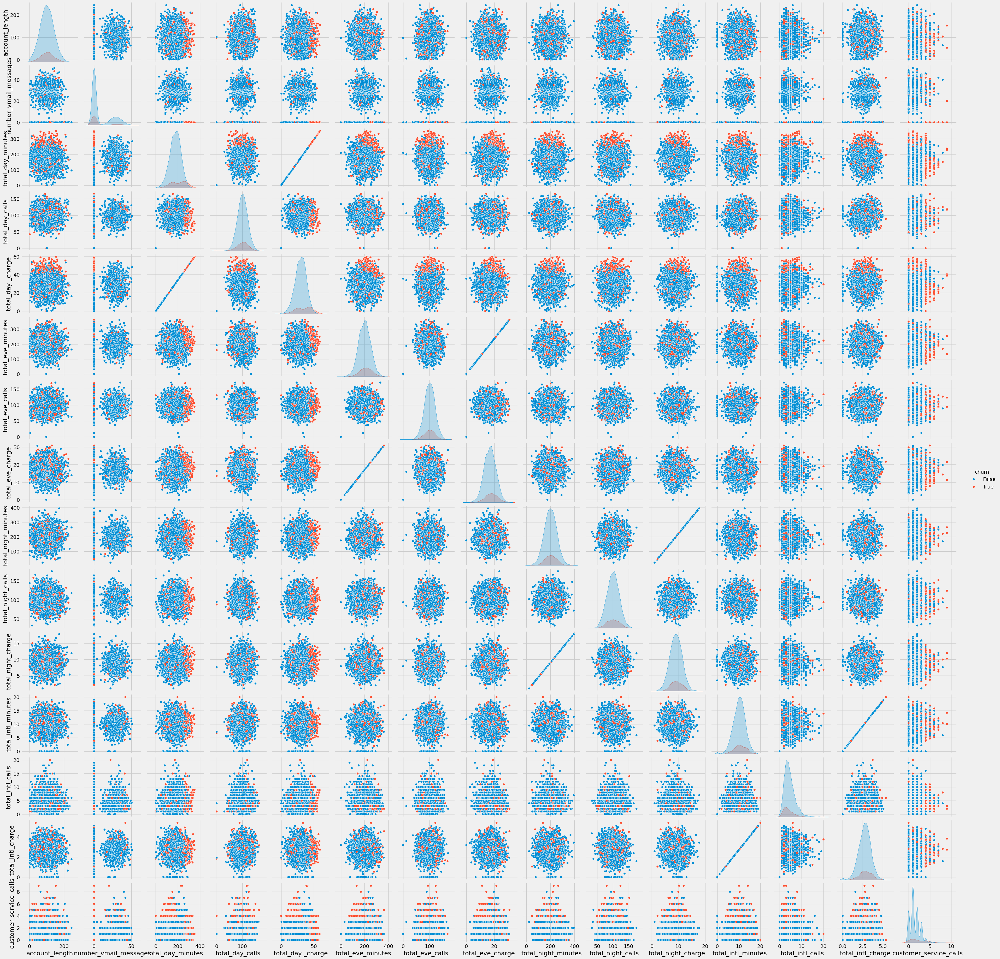

In [430]:
sns.pairplot(df , hue ='churn')

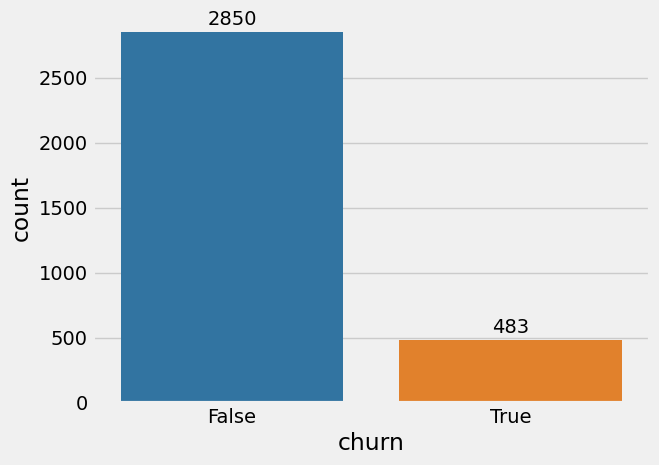

In [519]:
churn_count = df['churn'].value_counts()
ax = sns.countplot(data = df , x ='churn' , palette='tab10' , hue = 'churn' , legend=False)


for i in range(churn_count.shape[0]):
    count = churn_count.iloc[i]
    x = i
    y =count+100
    ax.annotate(count,(x,y) , ha ='center' , va ='center')
    

plt.show()

<Axes: xlabel='account_length', ylabel='Count'>

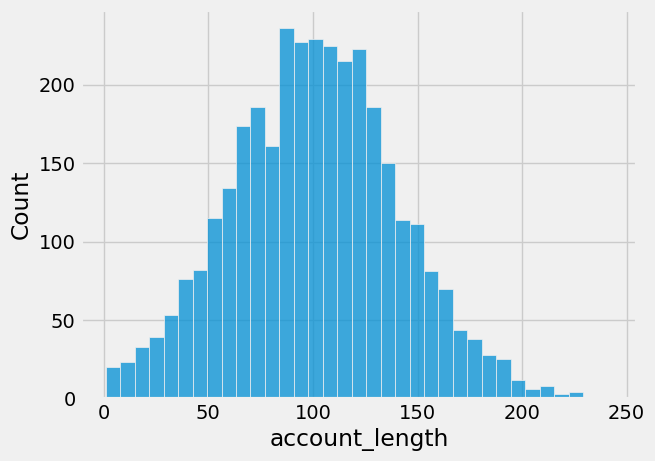

In [520]:
sns.histplot(data=df , x='account_length')

`Top 5 states have customers`

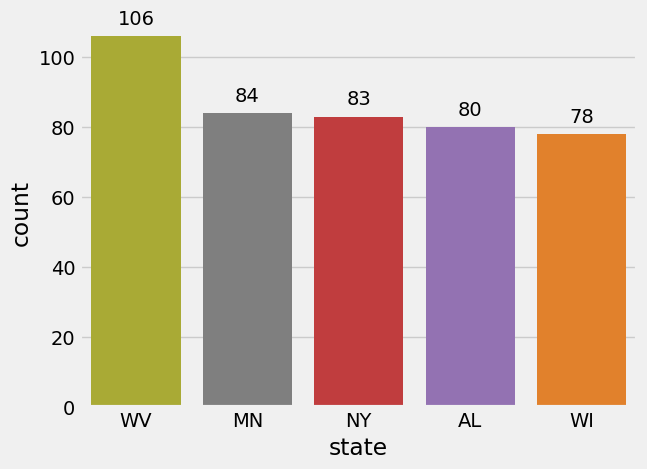

In [521]:
state_count = df['state'].value_counts()

ax = sns.countplot(data=df, x='state', palette='tab10', order=state_count.index[:5] , hue ='state' , legend =False)

for i in range(5):
    count = state_count.iloc[i]
    x = i
    y = count +5
    ax.annotate(count, (x, y), ha='center', va='center')

plt.show()

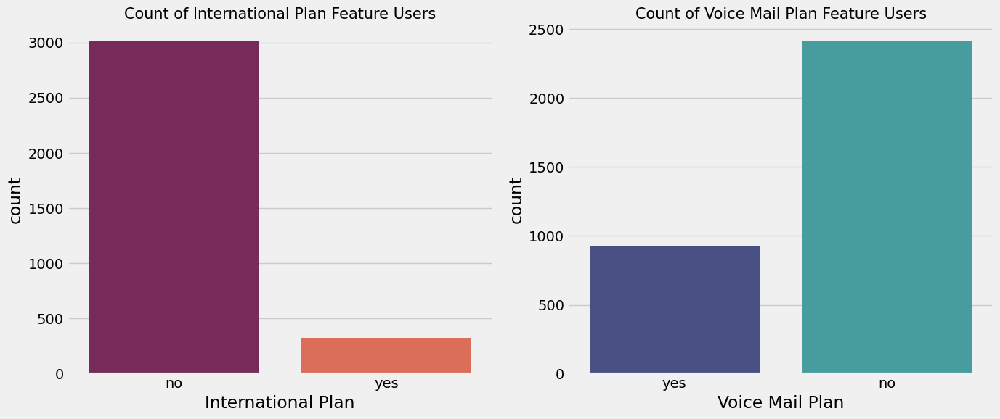

In [522]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))


sns.countplot(data=df, x='international_plan', palette='rocket', hue='international_plan', ax=axes[0], legend=False)
axes[0].set_title('Count of International Plan Feature Users', fontsize=15)
axes[0].set_xlabel('International Plan')


sns.countplot(data=df, x='voice_mail_plan', palette='mako', hue='voice_mail_plan', ax=axes[1], legend=False)
axes[1].set_title('Count of Voice Mail Plan Feature Users', fontsize=15)
axes[1].set_xlabel('Voice Mail Plan')


plt.tight_layout()


plt.show()


### `Feature Extraction`

In [523]:
df['total_charge'] =df['total_day _charge']+df['total_eve_charge']+df['total_night_charge']+df['total_intl_charge']
df['total_minutes'] =df['total_day_minutes']+df['total_eve_minutes']+df['total_night_minutes']+df['total_intl_minutes']
df['total_calls'] =df['total_day_calls']+df['total_eve_calls']+df['total_night_calls']+df['total_intl_calls']

In [524]:
df.head()

,state,account_length,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day _charge,total_eve_minutes,total_eve_calls,...,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,customer_service_calls,churn,total_charge,total_minutes,total_calls
0,KS,128,no,yes,25,265.1,110,45.07,197.4,99,...,91,11.01,10.0,3,2.70,1,False,75.56,717.2,303
1,OH,107,no,yes,26,161.6,123,27.47,195.5,103,...,103,11.45,13.7,3,3.70,1,False,59.24,625.2,332
2,NJ,137,no,no,0,243.4,114,41.38,121.2,110,...,104,7.32,12.2,5,3.29,0,False,62.29,539.4,333
3,OH,84,yes,no,0,299.4,71,50.90,61.9,88,...,89,8.86,6.6,7,1.78,2,False,66.80,564.8,255
4,OK,75,yes,no,0,166.7,113,28.34,148.3,122,...,121,8.41,10.1,3,2.73,3,False,52.09,512.0,359


total_charge




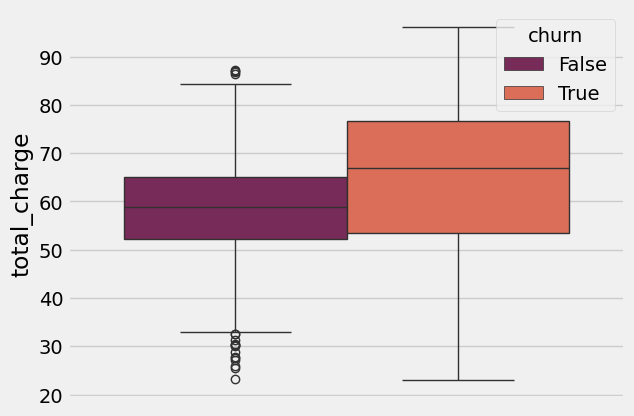



total_minutes




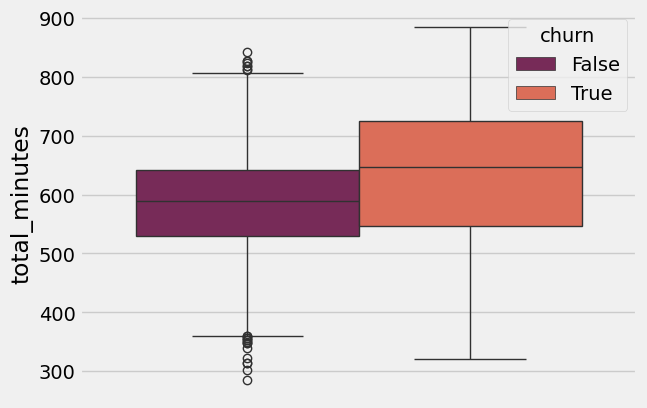



total_calls




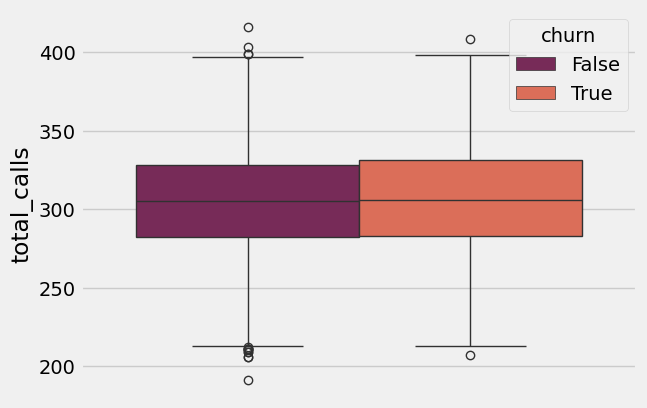

In [532]:
for col in df[['total_charge','total_minutes','total_calls']]:
    print(f'{col}')
    print('\n')
    sns.boxplot(data=df , y = col , palette='rocket' , hue ='churn')
    plt.show()
    print('\n')

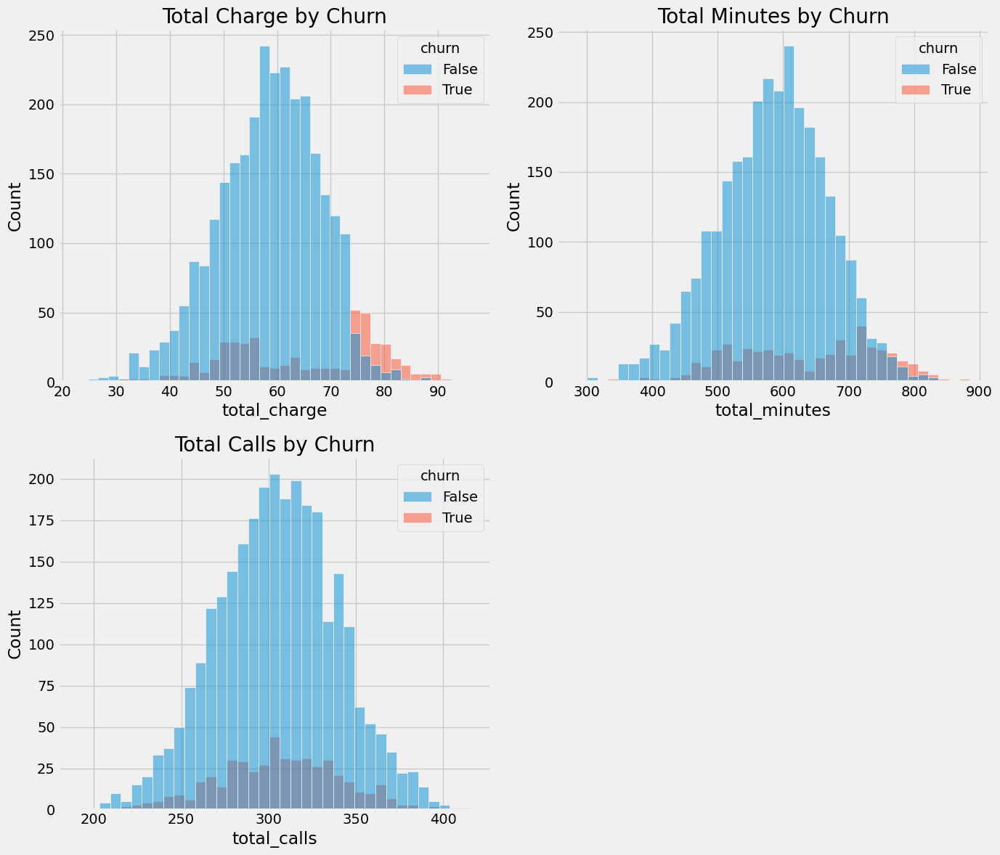

In [437]:
fig, axes = plt.subplots(2, 2, figsize=(14, 12))


sns.histplot(data=df, x='total_charge', hue='churn', ax=axes[0, 0])
axes[0, 0].set_title('Total Charge by Churn')


sns.histplot(data=df, x='total_minutes', hue='churn', ax=axes[0, 1])
axes[0, 1].set_title('Total Minutes by Churn')


sns.histplot(data=df, x='total_calls', hue='churn', ax=axes[1, 0])
axes[1, 0].set_title('Total Calls by Churn')


fig.delaxes(axes[1, 1])


plt.tight_layout()


plt.show()

In [438]:
df2 = df[df['total_charge'] > 75]
df2['churn'].value_counts()

churn
True     174
False     60
Name: count, dtype: int64

In [439]:
df2 = df[df['total_charge'] < 75]
df2['churn'].value_counts()

churn
False    2790
True      309
Name: count, dtype: int64

* > `It appears that when customers' daily charges exceed 75, their likelihood of churning increases.`

(<module 'matplotlib.pyplot' from 'C:\\Users\\moham\\AppData\\Local\\Programs\\Python\\Python312\\Lib\\site-packages\\matplotlib\\pyplot.py'>,
 <Axes: xlabel='state', ylabel='count'>)

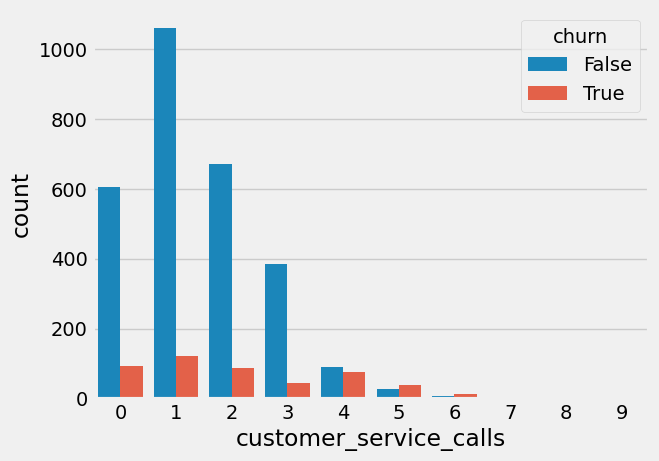

In [440]:
sns.countplot(data=df, x='customer_service_calls' , hue ='churn')
plt,ax

In [441]:
for i in range (6):
    value = df[df['customer_service_calls'] == i]['churn'].value_counts()
    print(f'value for {i} customer service calls'  )
    print(value)
    print('_'*85)

value for 0 customer service calls
churn
False    605
True      92
Name: count, dtype: int64
_____________________________________________________________________________________
value for 1 customer service calls
churn
False    1059
True      122
Name: count, dtype: int64
_____________________________________________________________________________________
value for 2 customer service calls
churn
False    672
True      87
Name: count, dtype: int64
_____________________________________________________________________________________
value for 3 customer service calls
churn
False    385
True      44
Name: count, dtype: int64
_____________________________________________________________________________________
value for 4 customer service calls
churn
False    90
True     76
Name: count, dtype: int64
_____________________________________________________________________________________
value for 5 customer service calls
churn
True     40
False    26
Name: count, dtype: int64
______________

* > `It appears that when customers' service calls increase , their likelihood of churning increases.`

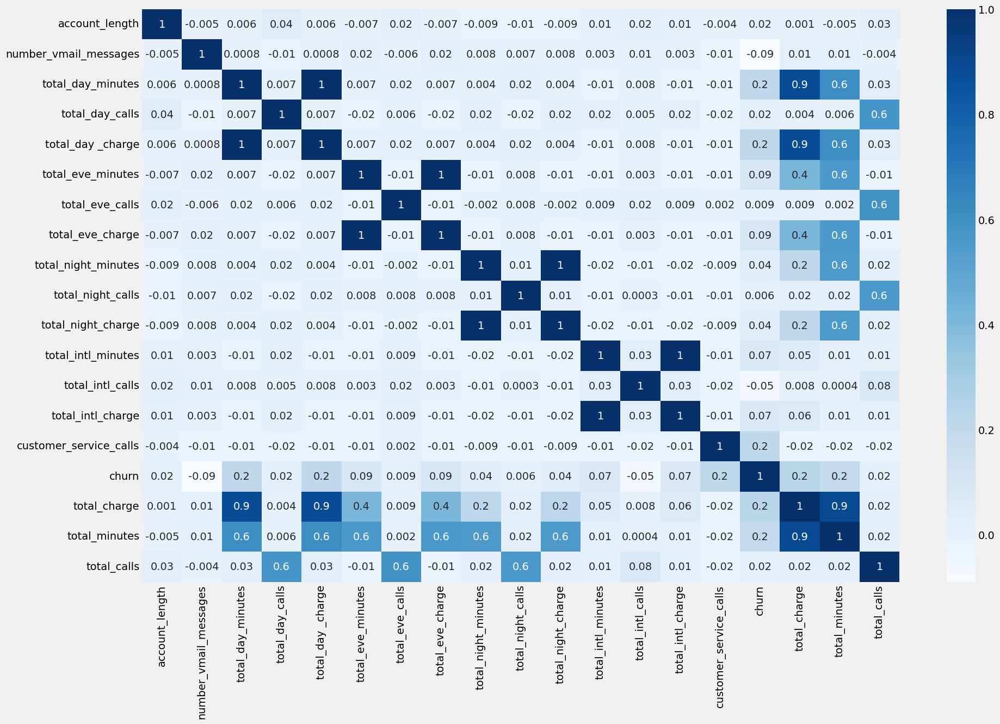

In [442]:
plt.figure(figsize=(20,13))
sns.heatmap(df.select_dtypes(exclude=['object']).corr() , cmap = 'Blues' , annot= True , fmt = '.1g')

plt.show()

In [443]:
df.drop(['state','total_day_minutes','total_day_calls','total_day _charge','total_eve_minutes','total_eve_calls','total_eve_charge',
         'total_night_minutes','total_night_calls','total_night_charge','total_intl_minutes','total_intl_calls','total_intl_charge']
         , axis =1 , inplace =True)

### `Handeling category columns`

In [444]:
df['international_plan'] = df['international_plan'].map({'no' : 0 , 'yes' : 1})
df['voice_mail_plan'] = df['voice_mail_plan'].map({'no' : 0 , 'yes' : 1})

In [445]:
df.head()

,account_length,international_plan,voice_mail_plan,number_vmail_messages,customer_service_calls,churn,total_charge,total_minutes,total_calls
0,128,0,1,25,1,False,75.56,717.2,303
1,107,0,1,26,1,False,59.24,625.2,332
2,137,0,0,0,0,False,62.29,539.4,333
3,84,1,0,0,2,False,66.80,564.8,255
4,75,1,0,0,3,False,52.09,512.0,359


In [446]:
df['churn'].value_counts()

churn
False    2850
True      483
Name: count, dtype: int64

### `Handeling outliers`

In [533]:
outlieres_indicies = detect_outliers(df ,0, df.select_dtypes(include = ['float64' ,'int64']))
100*(len(outlieres_indicies)/df.shape[0])

16.621662166216623

In [450]:
df.drop(outlieres_indicies , inplace = True)

### `Splitting Data`

In [451]:
x =df.drop('churn' , axis =1)
y= df['churn']
smote = SMOTE()
x,y = smote.fit_resample(x,y)
x_train , x_test , y_train , y_test = train_test_split(x , y , test_size=0.35 , random_state=42 , stratify=y ,shuffle=True)
print('x_train shape -- ', x_train.shape)
print('y_train shape -- ', y_train.shape)
print('x_test shape -- ', x_test.shape)
print('y_test shape -- ', y_test.shape)

x_train shape --  (3251, 8)
y_train shape --  (3251,)
x_test shape --  (1751, 8)
y_test shape --  (1751,)


In [452]:
sc = StandardScaler()
x_train_final = sc.fit_transform(x_train)
x_test_final = sc.transform(x_test)

In [453]:
y.value_counts()

churn
False    2501
True     2501
Name: count, dtype: int64

### `Models`

In [454]:
models = {
    'ovo' : OneVsOneClassifier(estimator=RandomForestClassifier()),
    'knn' : KNeighborsClassifier(),
    'SGD': SGDClassifier(),
    'Lgr': LogisticRegression(),
    'xgb': xgb.XGBClassifier(),
    'dt' : DecisionTreeClassifier(),
    'RF' : RandomForestClassifier(),
    'bag': BaggingClassifier(),
    'gdb': GradientBoostingClassifier(),
    'SVC' : SVC(),
    'baf_clf' : BaggingClassifier(DecisionTreeClassifier(), n_estimators=500,max_samples=100, bootstrap=True)
          }

For ovo Model : 
__________________________________________________________________________________________
CV Scores: [0.96774194 0.95538462 0.94461538 0.95230769 0.92923077]
Train Score is 1.0
Test Score is 0.9571673329525985
              precision    recall  f1-score   support

       False       0.93      0.99      0.96       876
        True       0.99      0.93      0.96       875

    accuracy                           0.96      1751
   macro avg       0.96      0.96      0.96      1751
weighted avg       0.96      0.96      0.96      1751



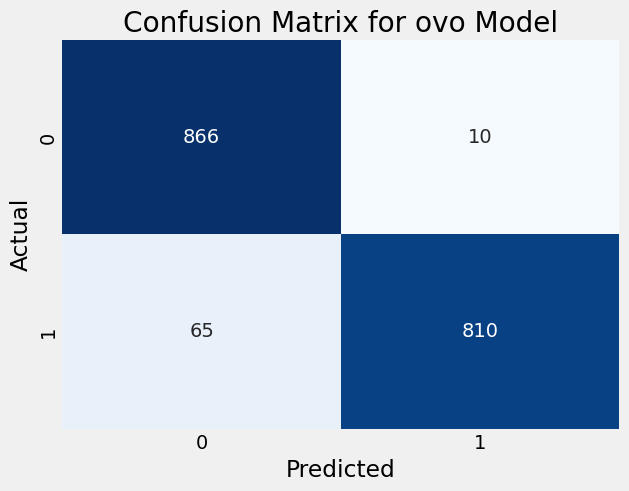

For knn Model : 
__________________________________________________________________________________________
CV Scores: [0.91551459 0.90307692 0.89384615 0.89538462 0.90153846]
Train Score is 0.9400184558597354
Test Score is 0.9154768703597944
              precision    recall  f1-score   support

       False       0.96      0.86      0.91       876
        True       0.88      0.97      0.92       875

    accuracy                           0.92      1751
   macro avg       0.92      0.92      0.92      1751
weighted avg       0.92      0.92      0.92      1751



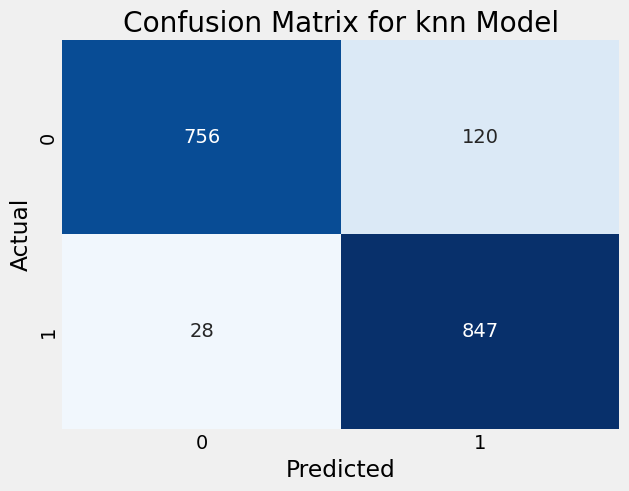

For SGD Model : 
__________________________________________________________________________________________
CV Scores: [0.8202765  0.84       0.85538462 0.83846154 0.80769231]
Train Score is 0.8391264226391879
Test Score is 0.8383780696744717
              precision    recall  f1-score   support

       False       0.83      0.85      0.84       876
        True       0.84      0.83      0.84       875

    accuracy                           0.84      1751
   macro avg       0.84      0.84      0.84      1751
weighted avg       0.84      0.84      0.84      1751



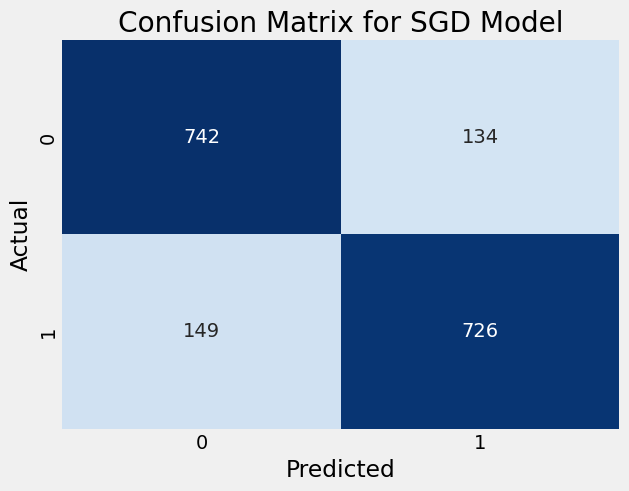

For Lgr Model : 
__________________________________________________________________________________________
CV Scores: [0.85867896 0.83230769 0.85846154 0.83692308 0.82461538]
Train Score is 0.8415872039372501
Test Score is 0.8338092518560822
              precision    recall  f1-score   support

       False       0.84      0.82      0.83       876
        True       0.83      0.85      0.84       875

    accuracy                           0.83      1751
   macro avg       0.83      0.83      0.83      1751
weighted avg       0.83      0.83      0.83      1751



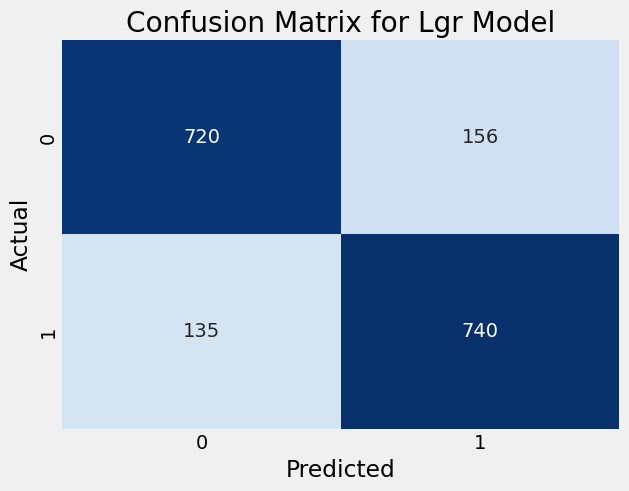

For xgb Model : 
__________________________________________________________________________________________
CV Scores: [0.95545315 0.94153846 0.92615385 0.93230769 0.92923077]
Train Score is 0.9993848046754845
Test Score is 0.9560251284980011
              precision    recall  f1-score   support

       False       0.94      0.97      0.96       876
        True       0.97      0.94      0.96       875

    accuracy                           0.96      1751
   macro avg       0.96      0.96      0.96      1751
weighted avg       0.96      0.96      0.96      1751



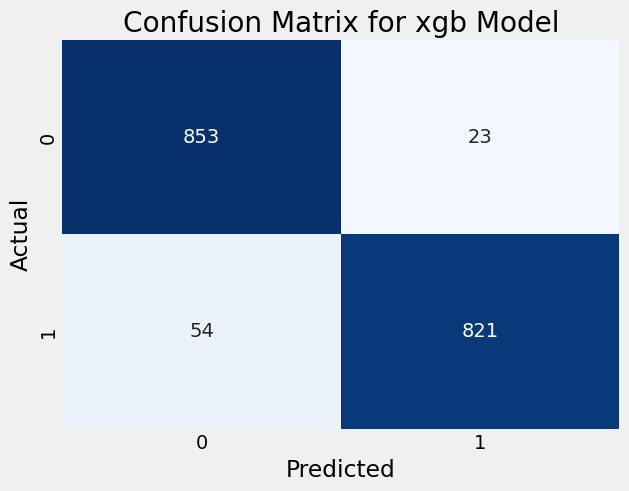

For dt Model : 
__________________________________________________________________________________________
CV Scores: [0.91551459 0.89538462 0.90769231 0.91230769 0.87692308]
Train Score is 1.0
Test Score is 0.9240434037692747
              precision    recall  f1-score   support

       False       0.93      0.92      0.92       876
        True       0.92      0.93      0.92       875

    accuracy                           0.92      1751
   macro avg       0.92      0.92      0.92      1751
weighted avg       0.92      0.92      0.92      1751



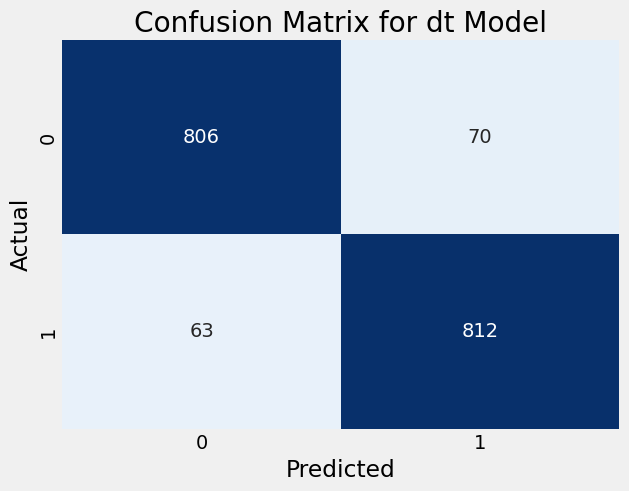

For RF Model : 
__________________________________________________________________________________________
CV Scores: [0.96466974 0.95230769 0.94       0.95230769 0.93384615]
Train Score is 1.0
Test Score is 0.952598515134209
              precision    recall  f1-score   support

       False       0.92      0.99      0.95       876
        True       0.99      0.92      0.95       875

    accuracy                           0.95      1751
   macro avg       0.95      0.95      0.95      1751
weighted avg       0.95      0.95      0.95      1751



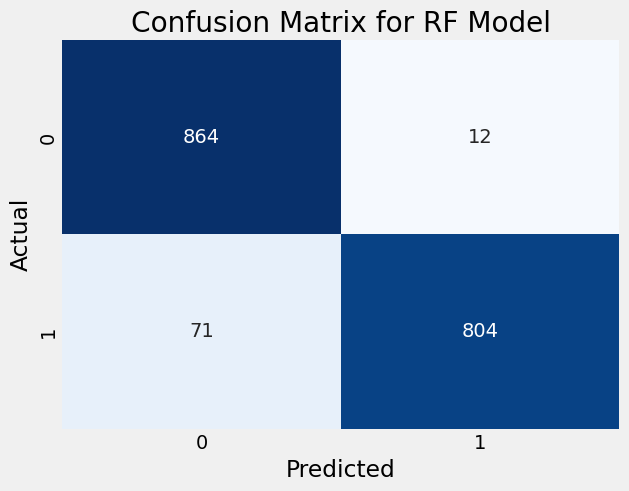

For bag Model : 
__________________________________________________________________________________________
CV Scores: [0.94316436 0.95076923 0.93384615 0.93846154 0.93076923]
Train Score is 0.9950784374038757
Test Score is 0.9428897772701313
              precision    recall  f1-score   support

       False       0.92      0.98      0.94       876
        True       0.97      0.91      0.94       875

    accuracy                           0.94      1751
   macro avg       0.94      0.94      0.94      1751
weighted avg       0.94      0.94      0.94      1751



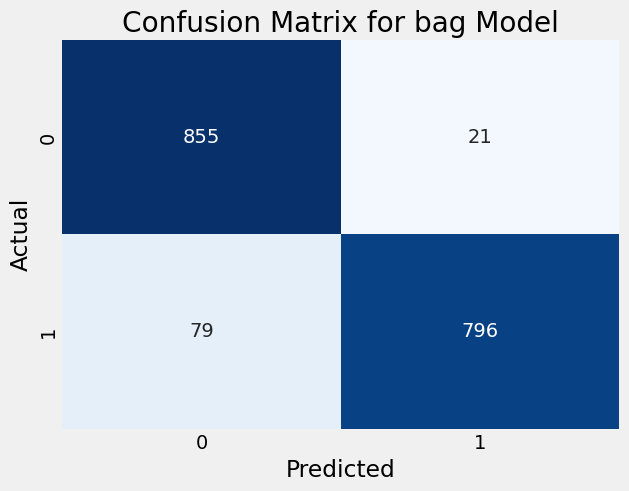

For gdb Model : 
__________________________________________________________________________________________
CV Scores: [0.9124424  0.9        0.90307692 0.89384615 0.88153846]
Train Score is 0.918179021839434
Test Score is 0.8972015990862364
              precision    recall  f1-score   support

       False       0.84      0.98      0.91       876
        True       0.98      0.81      0.89       875

    accuracy                           0.90      1751
   macro avg       0.91      0.90      0.90      1751
weighted avg       0.91      0.90      0.90      1751



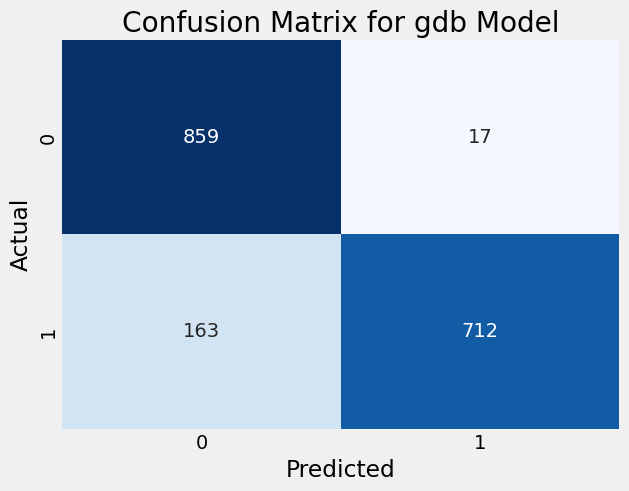

For SVC Model : 
__________________________________________________________________________________________
CV Scores: [0.89093702 0.87538462 0.87384615 0.87846154 0.86307692]
Train Score is 0.8828052906797909
Test Score is 0.8812107367218732
              precision    recall  f1-score   support

       False       0.83      0.96      0.89       876
        True       0.95      0.81      0.87       875

    accuracy                           0.88      1751
   macro avg       0.89      0.88      0.88      1751
weighted avg       0.89      0.88      0.88      1751



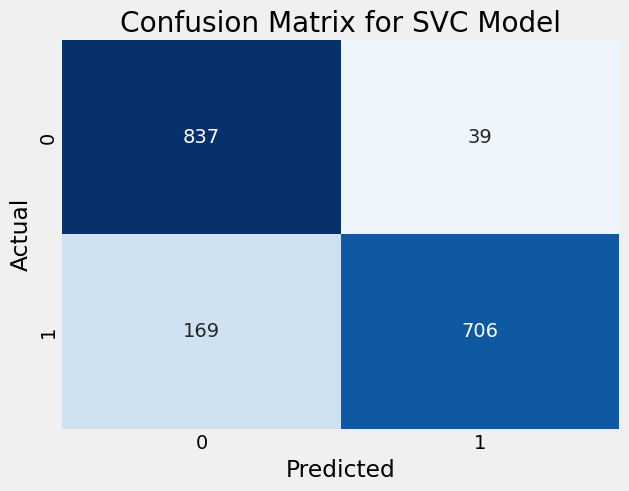

For baf_clf Model : 
__________________________________________________________________________________________
CV Scores: [0.87557604 0.86769231 0.85846154 0.86923077 0.84307692]
Train Score is 0.8695785912027069
Test Score is 0.86521987435751
              precision    recall  f1-score   support

       False       0.80      0.98      0.88       876
        True       0.98      0.75      0.85       875

    accuracy                           0.87      1751
   macro avg       0.89      0.87      0.86      1751
weighted avg       0.89      0.87      0.86      1751



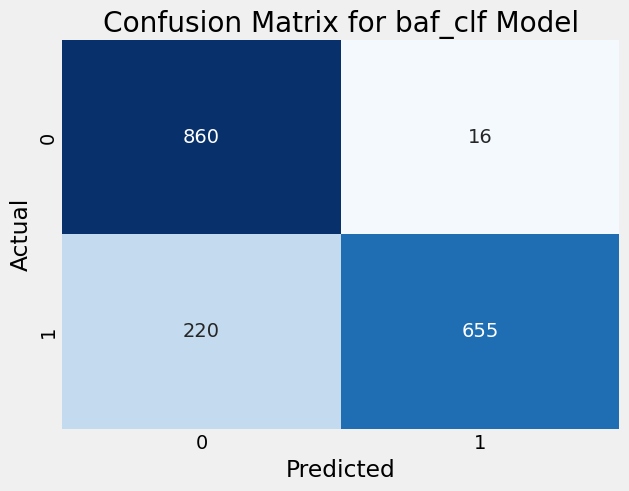

In [455]:
for key, model in models.items():
    print(f'For {key} Model : ')
    print('_' * 90)
    
    
    cv_scores = cross_val_score(model, x_train_final, y_train, cv=5, scoring='accuracy')
    print(f"CV Scores: {cv_scores}")
    
    
   
    model.fit(x_train_final, y_train)
    
    
    y_pred = model.predict(x_test_final)
    
    
    train_accuracy = accuracy_score(y_train, model.predict(x_train_final))
    test_accuracy = accuracy_score(y_test, y_pred)
    
    print(f"Train Score is {train_accuracy}")
    print(f"Test Score is {test_accuracy}")
    
    print(classification_report(y_test, y_pred))
    
    
    confusion_mat = confusion_matrix(y_test, y_pred)
    sns.heatmap(confusion_mat, fmt='g', annot=True, cbar=False, vmin=0, cmap='Blues')
    plt.title(f'Confusion Matrix for {key} Model')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

### `Tha best model is KNN classifier which has no overfitting and has accuracy 91.5 %`

### `Voting Classifier`

In [464]:
voting_clsf = VotingClassifier(
    estimators=[
        ('bag', BaggingClassifier()),
        #('svc', SVC()),
        ('gdb', GradientBoostingClassifier()),
        ('knn', KNeighborsClassifier())
    ],
    voting='hard'
)


cv_scores = cross_val_score(voting_clsf, x_train_final, y_train, cv=5, scoring='accuracy')


print("CV Scores: ", cv_scores)
print("Mean CV Score: ", cv_scores.mean())


voting_clsf.fit(x_train_final, y_train)


y_pred = voting_clsf.predict(x_test_final)


train_accuracy = accuracy_score(y_train, voting_clsf.predict(x_train_final))
test_accuracy = accuracy_score(y_test, y_pred)

print("Training Accuracy: ", train_accuracy)
print("Test Accuracy: ", test_accuracy)
print(classification_report(y_test, y_pred))

CV Scores:  [0.95391705 0.93846154 0.92615385 0.93076923 0.92      ]
Mean CV Score:  0.9338603332151718
Training Accuracy:  0.986773300522916
Test Accuracy:  0.9531696173615077
              precision    recall  f1-score   support

       False       0.93      0.98      0.95       876
        True       0.98      0.93      0.95       875

    accuracy                           0.95      1751
   macro avg       0.95      0.95      0.95      1751
weighted avg       0.95      0.95      0.95      1751



In [468]:
(0.987-0.953)*100 # < 5%  so no overfitting

3.400000000000003

### `Voting Classifier increases the accuracy to 95.3%`

In [490]:
input_shape = x_train_final.shape[1]
input_shape

8

In [504]:
model = Sequential()

model.add(Dense(265, input_shape=(input_shape,), activation='tanh'))
model.add(Dropout(0.2))

model.add(Dense(128, activation='tanh'))
model.add(Dropout(0.4))

model.add(Dense(128, activation='tanh'))
model.add(Dropout(0.5))

model.add(Dense(64, activation='tanh'))
model.add(Dropout(0.3))


model.add(Dense(64, activation='tanh'))
model.add(Dropout(0.1))

model.add(Dense(64, activation='tanh'))
model.add(Dropout(0.2))

model.add(Dense(64, activation='tanh'))
model.add(Dropout(0.1))

model.add(Dense(1, activation='sigmoid'))

model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

early_stopping = EarlyStopping(monitor='val_accuracy', patience=200, restore_best_weights=True)

model.summary()

Model: "sequential_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_86 (Dense)                     │ (None, 265)                 │           2,385 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_67 (Dropout)                 │ (None, 265)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_87 (Dense)                     │ (None, 128)                 │          34,048 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_68 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_88 (Dense)                     │ (None, 128)                 │          16,512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_69 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_89 (Dense)                     │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_70 (Dropout)                 │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_90 (Dense)                     │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_71 (Dropout)                 │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_91 (Dense)                     │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_72 (Dropout)                 │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_92 (Dense)                     │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_73 (Dropout)                 │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_93 (Dense)                     │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 73,746 (288.07 KB)

 Trainable params: 73,746 (288.07 KB)

 Non-trainable params: 0 (0.00 B)

In [505]:
history = model.fit(x= x_train_final, y= y_train, validation_data= (x_test_final, y_test), validation_split= 0.1, batch_size= 512, epochs=1500, verbose=1, 
          callbacks=[early_stopping])

Epoch 1/1500
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - accuracy: 0.6490 - loss: 0.6175 - val_accuracy: 0.8161 - val_loss: 0.4909
Epoch 2/1500
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8008 - loss: 0.4840 - val_accuracy: 0.8270 - val_loss: 0.4334
Epoch 3/1500
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.8186 - loss: 0.4544 - val_accuracy: 0.8338 - val_loss: 0.4184
Epoch 4/1500
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.8371 - loss: 0.4285 - val_accuracy: 0.8355 - val_loss: 0.4055
Epoch 5/1500
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.8428 - loss: 0.4056 - val_accuracy: 0.8504 - val_loss: 0.3754
Epoch 6/1500
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8434 - loss: 0.4046 - val_accuracy: 0.8584 - val_loss: 0.3680
Epoch 7/1500
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.8464 - loss: 0.3843 - val_accuracy: 0.8629 - val_loss: 0.3473
Epoch 8/1500
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.8544 - loss: 0.3721 - val_accuracy: 0.8658 - va

In [506]:
model.evaluate(x_test_final, y_test)

55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - accuracy: 0.9250 - loss: 0.1902


[0.18750053644180298, 0.9229012131690979]

In [507]:
model.evaluate(x_train_final, y_train)

102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 706us/step - accuracy: 0.9421 - loss: 0.1205


[0.127898171544075, 0.9397108554840088]

# `So best Model is Votting Classifier`

### `Saving Model`

In [535]:
import joblib
joblib.dump(sc , 'scaler.pkl')
joblib.dump(model , 'voting_clsf.pkl')

['voting_clsf.pkl']